#  Moving averages

In many applications of machine learning the input data has *spatial* structure that can, and should, be leveraged when solving associated learning problems.  In this short post we discuss single-dimensional moving averages, which are widely used in machine learning as a pre-processing step for time-series problems.  

You can skip around this document to particular subsections via the hyperlinks below.

-  [Denoising time series using a moving average](#moving-average-intro)
-  [Moving averages: mathematical details](#moving-average-details)
-  [Python implementation](#python-implementation)

In [1]:
## This code cell will not be shown in the HTML version of this notebook
# imports from custom library for animations
import sys
sys.path.append('../../')
from demo_libraries import timeseries_library as tlib

# import standard libs
import numpy as np
import pandas as pd

# path to data
datapath = '../../datasets/plain_timeseries/'

# This is needed to compensate for matplotlib notebook's tendancy to blow up images when plotted inline
%matplotlib notebook
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

%load_ext autoreload
%autoreload 2

<a id='moving-average-intro'></a>
## Denoising time series using a moving average

Suppose we have a *time series* like the one shown below (a snippet of historical stock prices for a major car manufacturer).  When analyzing such time series for trends it is quite common to first *smooth* them.  One way to do this is via a *moving average* - wherein we take a small window and slide it along the time series from its start to finish and average the values inside.  Taking the average inside of each little window tends to cancel out noisy values, resulting in a smoothed version of the original series that is easier to study.  Below we animate the process of building a moving average, and as you move the slider from left to right you will see the window in which each average is computed, straddled on both sides by vertical blue bars, move from left to right across the series with the resulting moving average shown as a pink series.


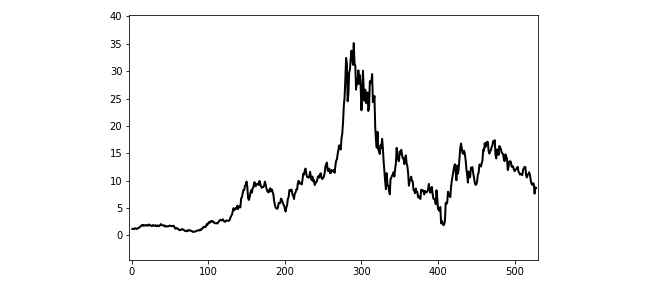
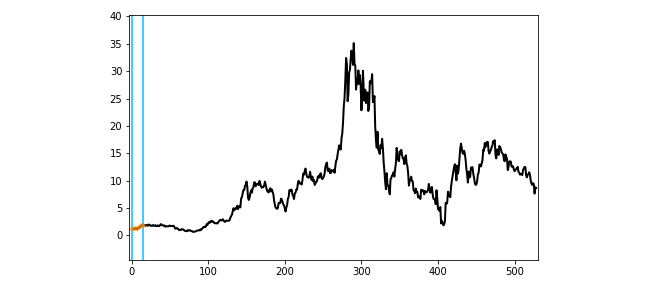
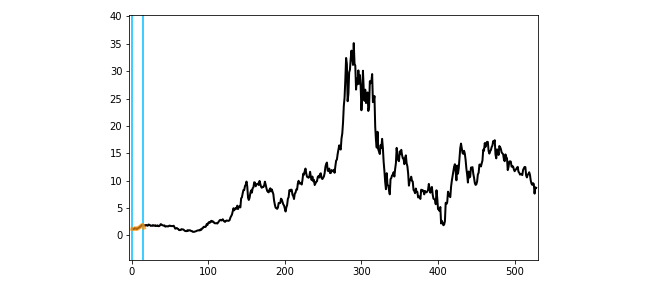
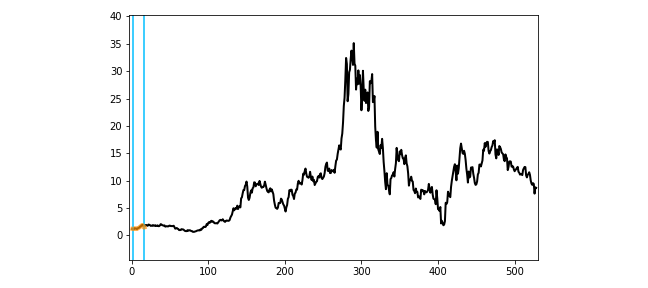
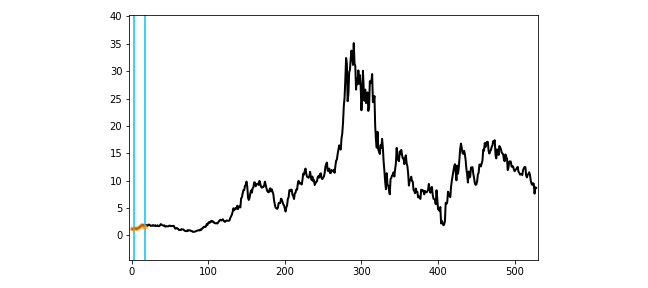
...
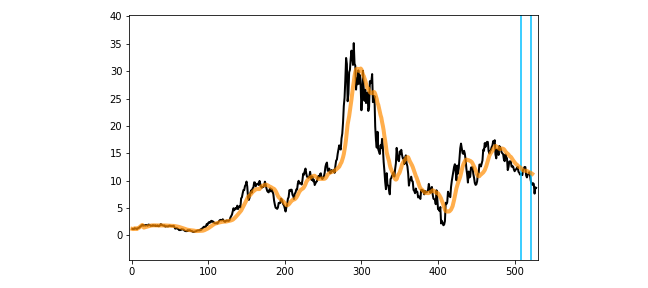
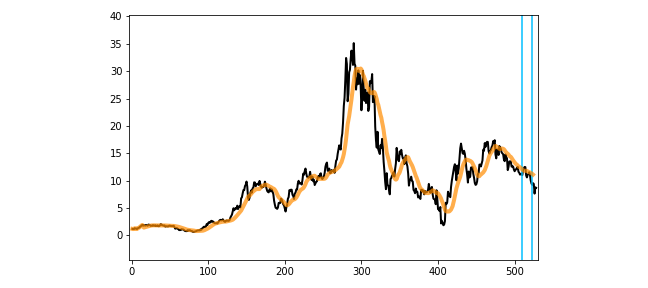
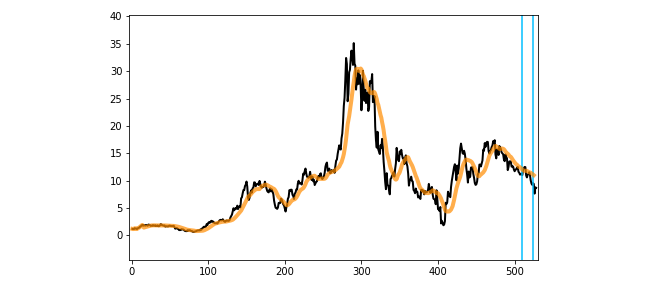
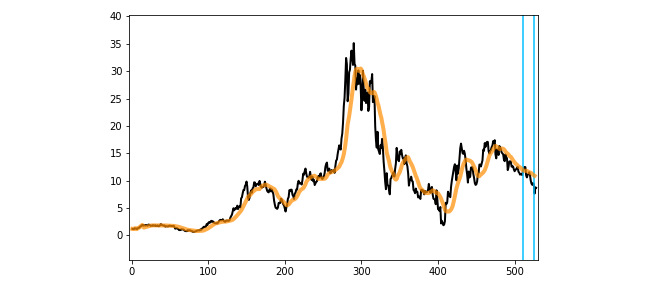
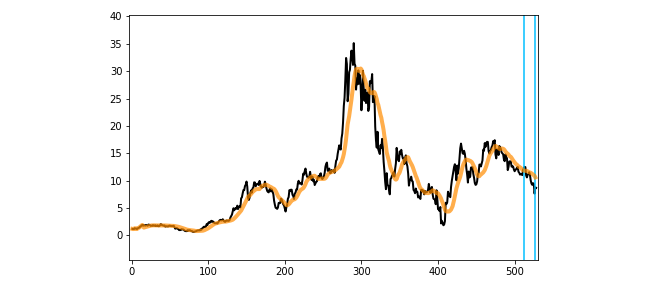

In [6]:
## This code cell will not be shown in the HTML version of this notebook
# load in data
csvname = datapath + 'ford_data.csv'
data = pd.read_csv(csvname)
x = np.array(data['Close'])    # date: 1980 to 2017

# moving average function
def moving_average(x,D):
    y = [v for v in x[:D]]
    for p in range(len(x) - D):
        # make next element
        b = np.sum(x[p:p+D])/float(D)
        y.append(b)
    return np.array(y)

# produce moving average time series
D = 15
y = moving_average(x,D)

# run animator
demo = tlib.time_series_animators.Visualizer()
demo.animate_moving_ave(x,y,D)

Below we animate the process above, only on the first $50$ elements of the input series.


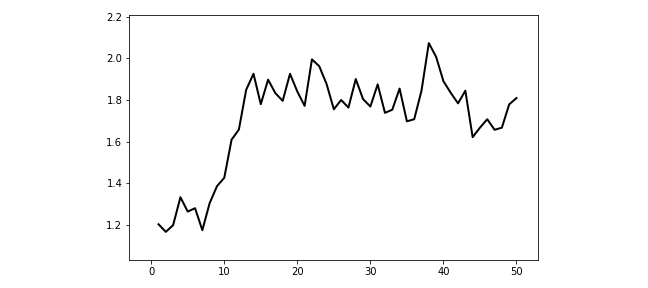
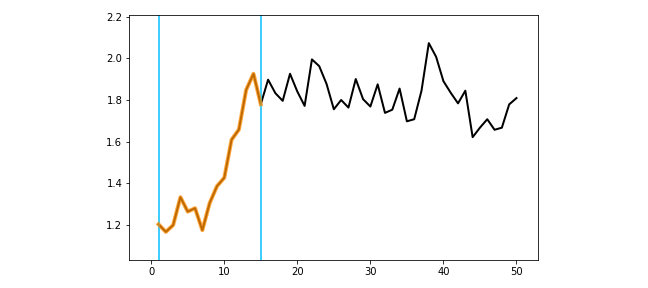
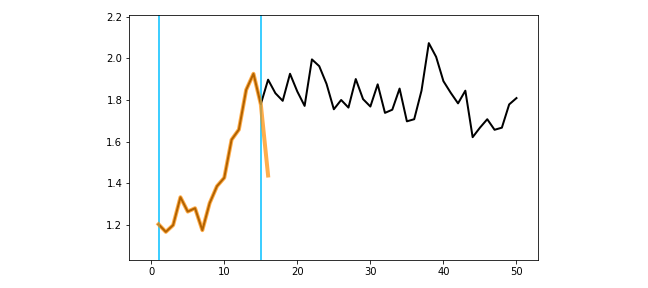
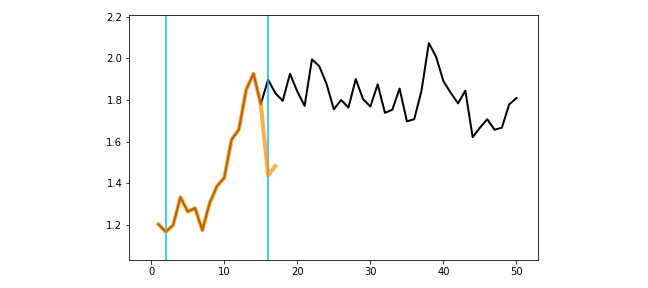
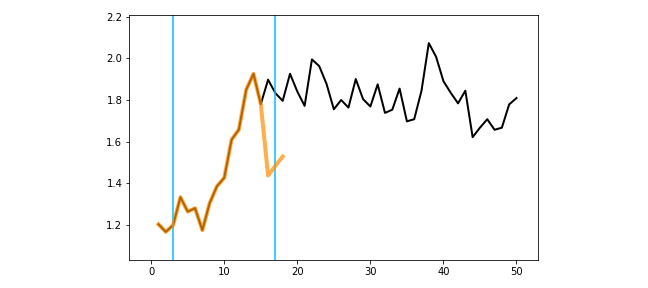
...
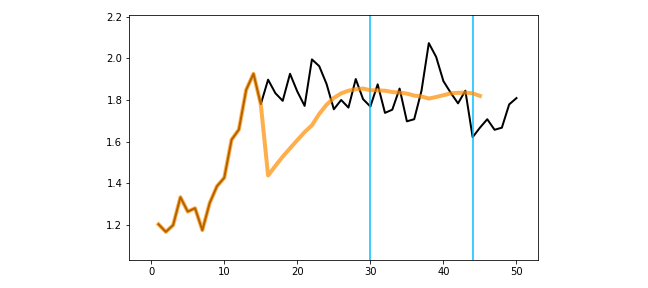
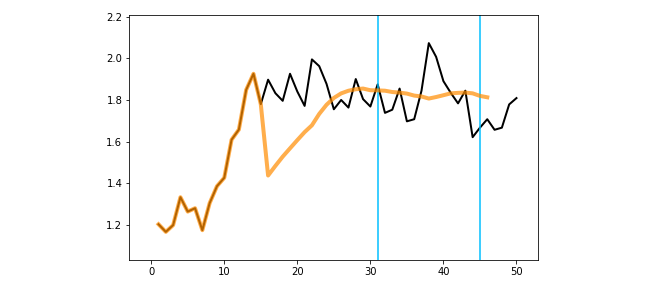
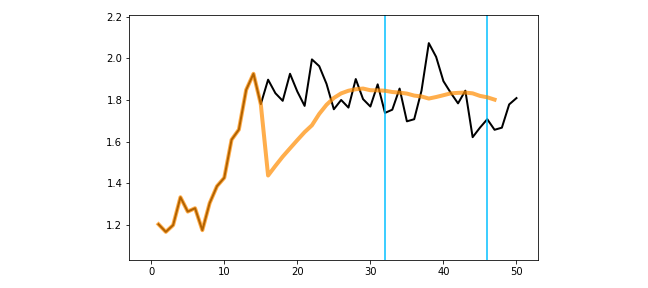
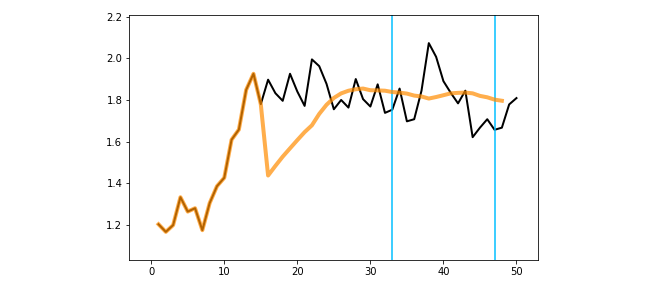
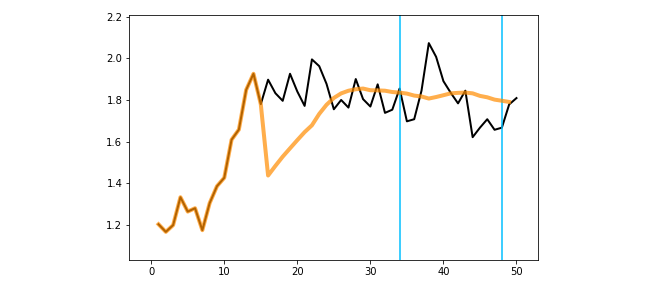

In [7]:
## This code cell will not be shown in the HTML version of this notebook
# run animator
demo = tlib.time_series_animators.Visualizer()
demo.animate_moving_ave(x[:50],y[:50],D)

In these examples the length of the window - also called the "order" of the moving average and denoted by $D$ - was $D = 15$.  Note as you increase the order how the moving average gets smoother, but mirrors the structure of the true underlying input sequence less and less.  We illustrate this via the animation below - as you pull the slider from left to right the order of the moving average smoother increases.

Also notice how the delay of the moving average - how its values consistently trail those of the original series - increases with the order of the system and is an artifact of using a large history of equally weighted examples of the series as a predictor of its next values.


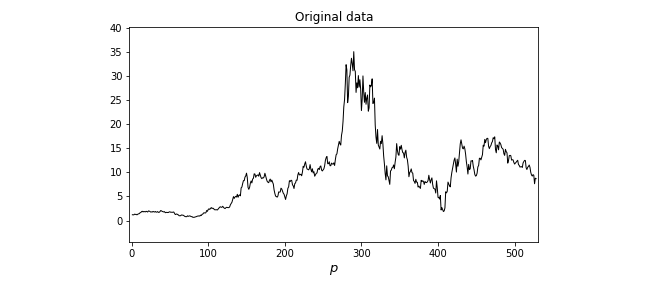
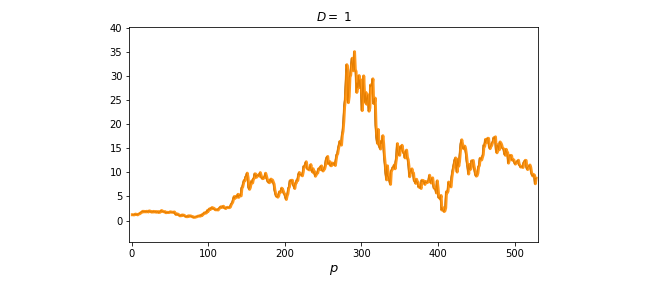
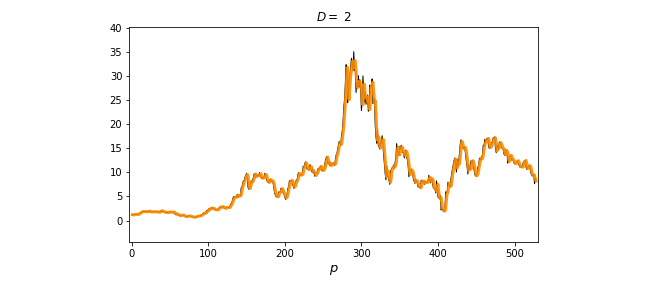
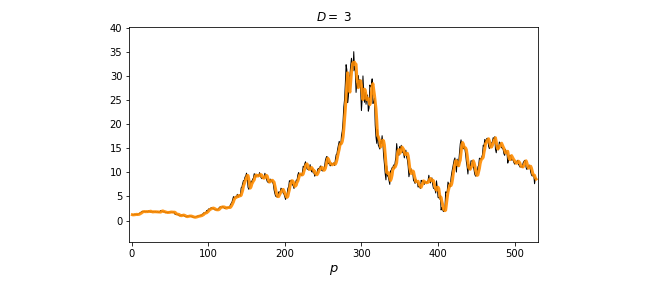
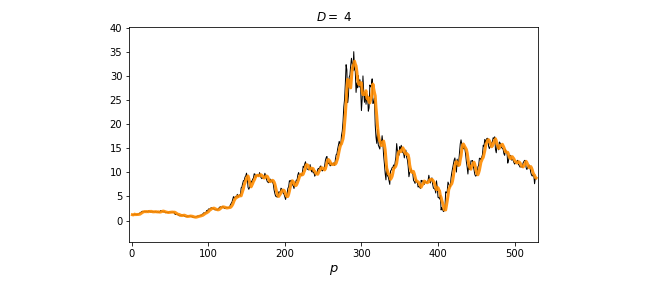
...
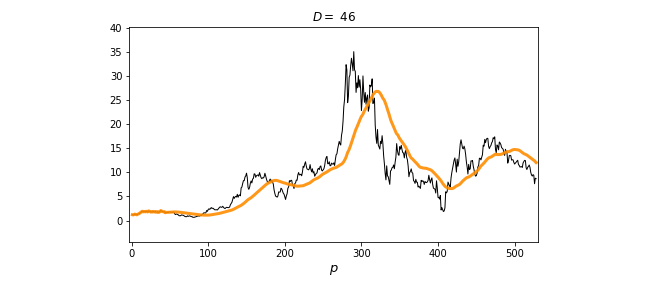
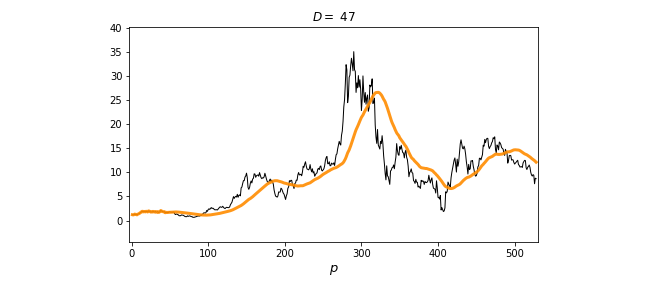
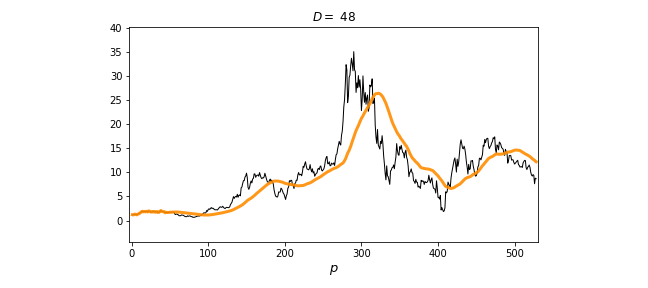
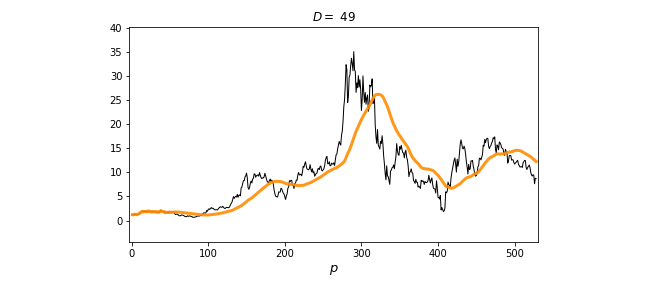
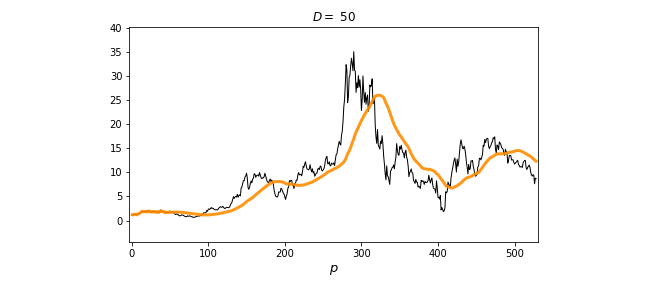

In [10]:
## This code cell will not be shown in the HTML version of this notebook
# moving average function
def moving_average(x,D):
    y = [v for v in x[:D]]
    for t in range(len(x) - D):
        # make next element
        b = np.sum(x[t:t+D])/float(D)
        y.append(b)
    return np.array(y)

# load in data
csvname = datapath + 'ford_data.csv'
data = pd.read_csv(csvname)
x = np.array(data['Close'])    # date: 1980 to 2017

# run animator    
demo = tlib.time_series_animators.Visualizer()
params = np.arange(1,51)
demo.animate_moving_average_range(x,moving_average,params)

<a id='moving-average-details'></a>
## Moving averages: mathematical details

Time-series data is one of the most common types of one-dimensional data one typically deals with in machine learning.  A single dimensional time-series data set consisting of $P$ naturally ordered points takes the general form

\begin{equation}
\left(t_1,x_1\right),\, \left(t_2,x_2\right),\, \ldots,\, \left(t_P,x_P\right)
\end{equation}

where the inputs $t_1,\ldots,t_P$ are time-marks or time-stamps sorted in ascending order (that is, $t_1<t_2<\cdots<t_P$), with $x_1,\ldots,x_P$ denoting the corresponding output values respectively. Figure 1 shows a prototypical time-series data set where every two successive data points, i.e., $\left(t_p,x_p\right)$ and $\left(t_{p+1},x_{p+1}\right)$, are connected via a line segment. This - typically referred to as *linear interpolation* - is done merely to facilitate visualization of the time-series data by giving it a continuous appearance. 

<figure>
<img src="images/prototypical_time_series_data.png" width="80%" height="auto"/>
<figcaption> <strong>Figure 1:</strong> <em> A prototypical time-series data with $N=6$ data points.</em>
</figcaption>
</figure>

Time-series data, in many cases, is collected at equally-spaced points in time.  For example, stock exchanges around the world typically publish their data every few minutes (and in some cases every few seconds) whereas the federal spending as a percentage of GDP in the United States, again a time-series data, is published only once every year. Regardless of the temporal resolution and as long as the data is captured at equally-spaced points in time, we can drop the time-marks $t_1,\ldots,t_P$ and represent the data in Equation (1) simply as a one-dimensional sequence of length $P$    

\begin{equation}
x_1,\, x_2,\, \ldots,\, x_P 
\end{equation}

To construct the first elements in a moving average process for a generic time series we choose a window length or *order* $B$ that we will average over, and set the first $D$ elements of the moving average to the first $D$ elements of the time series as 

\begin{equation}
h_p = x_p \,\,\,\,\,\, p=1,...,D.
\end{equation}

This is sometimes referred to as an *initial condition*.  Once we have $D$ elements we can compute the first real average, setting 

\begin{equation}
h_{D+1} = \frac{x_1 + x_2 + \cdots + x_{D}}{D}.
\end{equation}

In general when reaching the $p^{th}$ element of the moving average series - where $p$ ranges from $p=D+1,...,P$ - we then compute the moving average value as

\begin{equation}
h_{p} = \frac{x_{p-1} + x_{p-2} + \cdots + x_{p-D}}{D}.
\end{equation}

The moving average is a simple example of a *dynamic system*, that is a function of naturally ordered (e.g., time series) data.

<a id='python-implementation'></a>
## Python implementation 

Moving averages can be implemented in `Python` in a straightforward manner, as shown below.  Here the input `x` (to be smoothed) is loaded in as a contiguous list or array, and `D` is the desired order of the moving average `h` which is returned as a list.

In [9]:
# a simple moving average function
def moving_average(x,D):
    # initialize moving average to input series until D elements are present
    h = [v for v in x[:D]]
    
    # loop over input series and compute moving averages
    for p in range(len(x) - D):
        # make next element as average of prior D inputs
        h.append(sum(x[p:p+D])/float(D))
    return h